Finding text using edge detection



- The purpose of this assignment is to use computer vision to extract specific features from images. In particular, we're going to see if we can find text. We are not interested in finding whole words right now; we'll look at how to find whole words in a coming class. For now, we only want to find language-like objects, such as letters and punctuation.



- Download and save the image at the link below:



https://upload.wikimedia.org/wikipedia/commons/f/f4/%22We_Hold_These_Truths%22_at_Jefferson_Memorial_IMG_4729.JPG



Using the skills you have learned up to now, do the following tasks:



- Draw a green rectangular box to show a region of interest (ROI) around the main body of text in the middle of the image. Save this as image_with_ROI.jpg.


- Crop the original image to create a new image containing only the ROI in the rectangle. Save this as image_cropped.jpg.


- Using this cropped image, use Canny edge detection to 'find' every letter in the image


- Draw a green contour around each letter in the cropped image. Save this as image_letters.jpg


TIPS

Remember all of the skills you've learned so far and think about how they might be useful
This means: colour models; cropping; masking; simple and adaptive thresholds; binerization; mean, median, and Gaussian blur.
Experiment with different approaches until you are able to find as many of the letters and punctuation as possible with the least amount of noise. You might not be able to remove all artifacts - that's okay!


Bonus challenges

If you want to push yourself, try to write a script which runs from the command line and which takes any similar input (an image containing text) and produce a similar output (a new image with contours drawn around every letter).


General instructions

For this exercise, you can upload either a standalone script OR a Jupyter Notebook
Save your script as edge_detection.py OR edge_detection.ipynb
If you have external dependencies, you must include a requirements.txt
You can either upload the script here or push to GitHub and include a link - or both!
Your code should be clearly documented in a way that allows others to easily follow along
Similarly, remember to use descriptive variable names! A name like cropped is more readable than crp.
The filenames of the saved images should clearly relate to the original image


Purpose

This assignment is designed to test that you have a understanding of:

how to use a variety of image processing steps;
how to perform edge detection;
how to combine these skills in order to find specific features in an image

In [3]:
 # Packages
import os # Path operations
import sys # Path operations
sys.path.append(os.path.join("..", "..", ".."))  # We need to include the home directory in our path, so we can read in our own module.
import cv2 # Image operations
import numpy as np # Numeric operatoins
from utils.imutils import jimshow # Showing image
from utils.imutils import jimshow_channel # Showing image channels
import matplotlib.pyplot as plt # Plotting

In [3]:
# Reading the image
fname = os.path.join("letter_data", "We_Hold_These_Truths_at_Jefferson_Memorial_IMG_4729.JPG")
image = cv2.imread(fname)

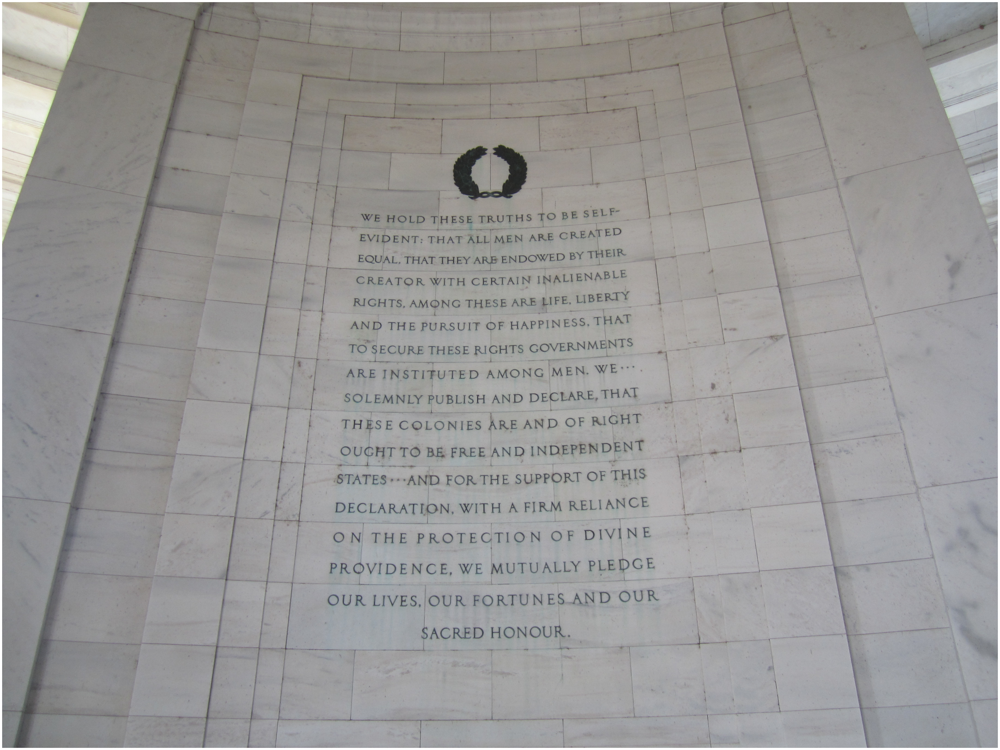

In [6]:
jimshow(image) 

In [5]:
# Now I'll draw a green, rectangular box to make a region of interest (ROI) - since we will be detecting letters I'll crop the area around these
# I'll start by inspecting the dimensions of the picture and taking the middle area

start_x = int(image.shape[1]/3)
end_x = int(2*(image.shape[1]/3))

start_y = int(image.shape[0]/3)
end_y = int(2*(image.shape[0]/3))

(3240, 4320)


In [6]:
# Now I'll see whether these coordinates gets an amount of text that I can analyze
image_ROI = cv2.rectangle(image.copy(), # Copy to avoid deconstructing the original image
              (start_x, start_y), # Start on x and y axis
              (end_x, end_y), # End on x and y
              (0, 255, 0), # Color - in this case green
              3) # Thickness of 3

In [38]:
# Now we need to save the image
def write_img(image, filepath, filename):
    outfile = os.path.join(filepath, filename) # Here, image_n is used to define which quadrant name to select in the output file
    cv2.imwrite(outfile, image) # Writing the file     

In [41]:
write_img(image = image_ROI, filepath = ".", filename = "image_with_ROI.jpg")

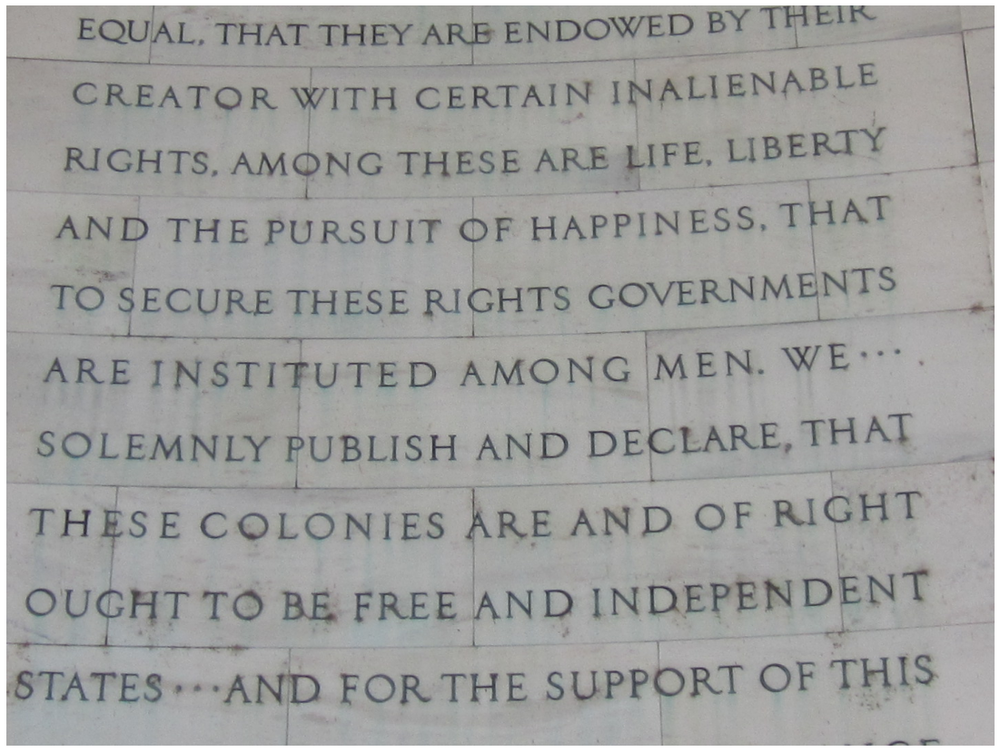

In [36]:
cropped = image[start_y:end_y, start_x:end_x]
jimshow(cropped)

In [39]:
write_img(image = cropped, filepath = ".", filename = "image_cropped.jpg")

In [40]:
# Now I'll see how we can extract edges with canny and find the letters. I'm starting by turning the picture into greyscale
grey_image = cv2.cvtColor(cropped, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(grey_image, (5,5), 0) # image, 5x5 kernel, 0 = amount of variation from the mean you can take into account - high = high variation

In [63]:
# Defining the canny edge detection
canny = cv2.Canny(blurred, 115, 150) # Min and max threshold - find parameters automatically or manually

In [64]:
# Defining the contours in the image
(contours,_) = cv2.findContours(canny.copy(), # using np function to make a copy rather than destroying the image itself
                 cv2.RETR_EXTERNAL, 
                 cv2.CHAIN_APPROX_SIMPLE) 

In [66]:
cropped_contours = cv2.drawContours(cropped.copy(), # image, contours, fill, color, thoickness
                         contours,
                         -1, # whihch contours to draw. -1 will draw contour for every contour that it finds
                         (0,255,0), # contour color
                         2)

In [67]:
# Sacin an image with highlighted letters 
write_img(image = cropped_contours, filepath = ".", filename = "image_letters.jpg")